<a href="https://colab.research.google.com/github/zombimann/Mathematical-video-animations-and-visualization/blob/main/Harmonic_Oscillations_Study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Harmonograph Simulation: Symphony in Symmetry

This notebook generates a visually stunning animation of **Harmonograph** patterns—geometric drawings created by combining perpendicular oscillations.

### Features
- **Ink-on-Paper Aesthetic**: Simulates charcoal ink on a textured cream paper background.
- **Harmonic Ratios**: Cycles through 6 classic frequency ratios associated with musical intervals (Unison, Octave, Perfect Fifth, etc.).
- **Dynamic Animation**: Features simulated friction decay and smooth transitions between patterns.

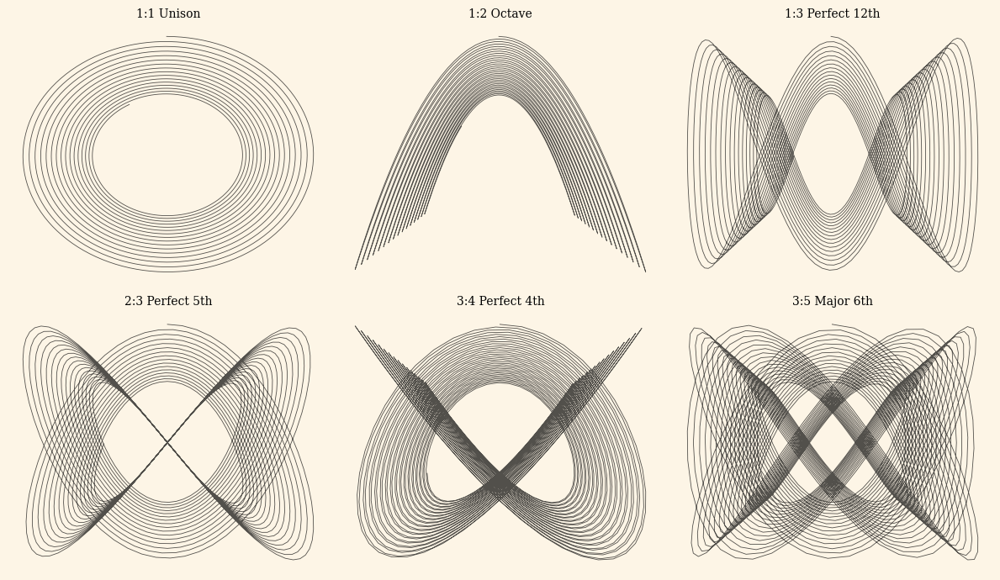

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.patheffects as patheffects
import matplotlib

# Optimization: Increase memory limit
matplotlib.rcParams['animation.embed_limit'] = 100.0

# STRICT CONFIGURATION: 30 seconds total
FPS = 30
DURATION = 30
TOTAL_FRAMES = FPS * DURATION

RATIO_DATA = [
    ((1, 1), "1:1 Unison"),
    ((1, 2), "1:2 Octave"),
    ((1, 3), "1:3 Perfect 12th"),
    ((2, 3), "2:3 Perfect 5th"),
    ((3, 4), "3:4 Perfect 4th"),
    ((3, 5), "3:5 Major 6th")
]
# Each pattern gets 5 seconds (150 frames)
FRAMES_PER_RATIO = TOTAL_FRAMES // len(RATIO_DATA)

def harmonograph(t, f1, f2, d1=0.007, d2=0.007, p1=0, p2=np.pi/2):
    x = np.exp(-d1*t) * np.sin(f1*t + p1)
    y = np.exp(-d2*t) * np.sin(f2*t + p2)
    return x, y

# Aesthetic Constants
BG_COLOR = '#FDF5E6'
INK_COLOR = '#0A0A0A'

fig = plt.figure(figsize=(8, 8), facecolor=BG_COLOR)
ax = fig.add_subplot(111)
ax.set_facecolor(BG_COLOR)

ink_effects = [patheffects.SimpleLineShadow(offset=(0.8, -0.8), shadow_color='#BCB8B1', alpha=0.4), patheffects.Normal()]
line, = ax.plot([], [], color=INK_COLOR, lw=1.5, alpha=0.9, path_effects=ink_effects)
label_ratio = ax.text(0.5, 0.05, '', transform=ax.transAxes, ha='center', fontsize=20, color='#444444', family='serif')

# Paper Texture
np.random.seed(42)
tex = np.random.normal(0.5, 0.03, (400, 400))
ax.imshow(tex, extent=[-1.5, 1.5, -1.5, 1.5], cmap='Greys', alpha=0.1, zorder=-1, interpolation='bilinear')

ax.set_xlim(-1.1, 1.1)
ax.set_ylim(-1.1, 1.1)
ax.axis('off')

# Time scale for the drawing
T_MAX_VAL = 120
T_BASE = np.linspace(0, T_MAX_VAL, 1000)

def init():
    line.set_data([], [])
    label_ratio.set_text('')
    return line, label_ratio

def update(frame):
    # Determine which harmonic ratio to show
    idx = min(frame // FRAMES_PER_RATIO, len(RATIO_DATA) - 1)
    (f1, f2), name = RATIO_DATA[idx]
    t_frame = frame % FRAMES_PER_RATIO

    # Progress through the current 5-second segment
    progress = t_frame / FRAMES_PER_RATIO
    t_idx = int(progress * len(T_BASE))
    t = T_BASE[:t_idx+1]
    x, y = harmonograph(t, f1, f2)

    # Dynamic line weight
    line.set_linewidth(1.2 + 0.6 * np.sin(frame * 0.2))

    # Fade out at the end of each 5s segment
    if t_frame > (FRAMES_PER_RATIO - 15):
        alpha = max(0, (FRAMES_PER_RATIO - t_frame) / 15)
        line.set_alpha(alpha * 0.9)
    else:
        line.set_alpha(0.9)

    line.set_data(x, y)
    label_ratio.set_text(name)
    return line, label_ratio

# Create animation with explicit frame count
ani = FuncAnimation(fig, update, frames=TOTAL_FRAMES, init_func=init, blit=True, interval=1000/FPS)
plt.close(fig)

# Display summary and video
fig_grid, axes = plt.subplots(2, 3, figsize=(12, 7), facecolor=BG_COLOR)
for i, ((f1, f2), name) in enumerate(RATIO_DATA):
    ax_g = axes.flatten()[i]
    gx, gy = harmonograph(np.linspace(0, 100, 2000), f1, f2)
    ax_g.plot(gx, gy, color=INK_COLOR, lw=0.6, alpha=0.7)
    ax_g.set_title(name, fontsize=10, family='serif')
    ax_g.axis('off')

plt.tight_layout()
plt.show()
display(HTML(ani.to_html5_video()))